### Student Information
Name: 留筠雅

Student ID: 711233112

GitHub ID: sue6609

---

### Instructions

1. First: do the **take home** exercises in the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://huggingface.co/datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data). The dataset contains a `sentiment` and `comment` columns, with the sentiment labels being: 'nostalgia' and 'not nostalgia'. Read the specificiations of the dataset for background details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/didiersalazar/DM2024-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Sunday)__. 

### Part 1: do the **take home** exercises.

In [2]:
# import library
import pandas as pd
import numpy as np
import nltk
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer
import plotly as py
import math
import PAMI
import umap
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [1]:
### Begin Assignment Here
# TEST necessary for when working with external scripts
%load_ext autoreload
%autoreload 2

In [2]:
# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups

categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
twenty_train = fetch_20newsgroups(subset='train', categories=categories,
                                  shuffle=True, random_state=42) 


In [3]:
import pandas as pd

# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

In [4]:
# add category to the dataframe
X['category'] = twenty_train.target
# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

### **>>> Exercise 2 (take home):** 
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information. 

In [5]:
#Answer here
# If you want to filter records where the category is either 1 or 3, 
#  select every 10th record in reverse order, and display the first 5 results, we can use query() as follows:

filter = X.query('category == 1 | category == 3')[::-10][0:5]
filter


,text,category,category_name
2249,From: shellgate!llo@uu4.psi.com (Larry L. Over...,3,soc.religion.christian
2226,From: nahess@mir.gatech.edu (Nicholas A. Hess)...,1,comp.graphics
2207,From: zyeh@caspian.usc.edu (zhenghao yeh) Subj...,1,comp.graphics
2189,From: schultz@schultz.kgn.ibm.com (Karl Schult...,1,comp.graphics
2172,"From: lmp8913@rigel.tamu.edu (PRESTON, LISA M)...",1,comp.graphics


### >>> **Exercise 5 (take home)** 
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [6]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [7]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

### Answer 

 1. Only NaN and None will be detected; other forms of missing data will not be considered True by .isnull().
 2. Therefore, the missing_example for IDs C and D will not be detected because they are strings.
 3. The missing_example for ID F will not be detected because an empty string is considered a valid string, not a missing value.


### >>> Exercise 6 (take home):
Notice any changes from the `X` dataframe to the `X_sample` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

 ### Answer
1. The length of the sample is 1000, as specified in the sample() function.
2. The index of X_sample may be different from the index of X. Because I am selecting a random sample.
3. Due to the random sampling, we may notice a slight difference in the count distribution of the variables, but there will not be a significant change (the category that originally had the highest count does not become the lowest after sampling).

In [8]:
X_sample = X.sample(n=1000) #random state
counts_x = X['category_name'].value_counts()
print("Original data:", counts_x/sum(counts_x))

counts_x_sample = X_sample['category_name'].value_counts()
print("Sampling data:", counts_x_sample/sum(counts_x_sample))



Original data: category_name
soc.religion.christian    0.265397
sci.med                   0.263181
comp.graphics             0.258751
alt.atheism               0.212672
Name: count, dtype: float64
Sampling data: category_name
soc.religion.christian    0.292
sci.med                   0.259
comp.graphics             0.240
alt.atheism               0.209
Name: count, dtype: float64


### >>> **Exercise 8 (take home):** 
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

![alt txt](https://i.imgur.com/9eO431H.png)

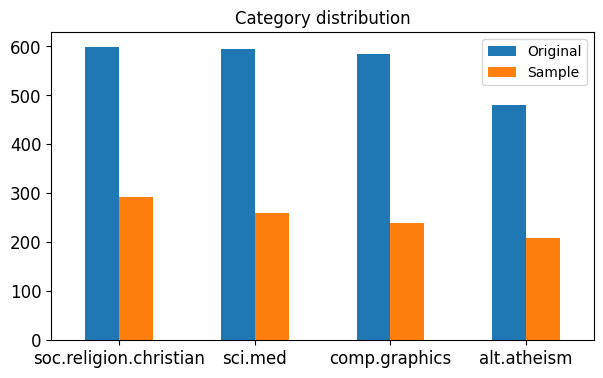

In [9]:
# Answer here
import matplotlib.pyplot as plt

counts_X_sample = X_sample.category_name.value_counts()
counts_X = X.category_name.value_counts()
ymax = max(counts_X.max(), counts_X_sample.max()) + 30

pd.concat([counts_X, counts_X_sample], axis = 1).plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, ymax], 
                                           rot = 0, fontsize = 12, figsize = (7,4), xlabel="")
plt.legend(["Original", "Sample"])
plt.show()

In [10]:
import nltk

# takes a like a minute or two to process
# 一元詞組
X['unigrams'] = X['text'].apply(lambda x: dmh.tokenize_text(x))

In [11]:
from sklearn.feature_extraction.text import CountVectorizer

#主要用於將文本轉換為詞頻矩陣（即每個文檔中詞語出現的次數）
count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text)
analyze = count_vect.build_analyzer()

### **>>> Exercise 9 (Watch Video):**
Let's analyze the first record of our X dataframe with the new analyzer we have just built. Go ahead try it!

In [12]:
# Answer here
analyze(X.text[0])

['from',
 'sd345',
 'city',
 'ac',
 'uk',
 'michael',
 'collier',
 'subject',
 'converting',
 'images',
 'to',
 'hp',
 'laserjet',
 'iii',
 'nntp',
 'posting',
 'host',
 'hampton',
 'organization',
 'the',
 'city',
 'university',
 'lines',
 '14',
 'does',
 'anyone',
 'know',
 'of',
 'good',
 'way',
 'standard',
 'pc',
 'application',
 'pd',
 'utility',
 'to',
 'convert',
 'tif',
 'img',
 'tga',
 'files',
 'into',
 'laserjet',
 'iii',
 'format',
 'we',
 'would',
 'also',
 'like',
 'to',
 'do',
 'the',
 'same',
 'converting',
 'to',
 'hpgl',
 'hp',
 'plotter',
 'files',
 'please',
 'email',
 'any',
 'response',
 'is',
 'this',
 'the',
 'correct',
 'group',
 'thanks',
 'in',
 'advance',
 'michael',
 'michael',
 'collier',
 'programmer',
 'the',
 'computer',
 'unit',
 'email',
 'collier',
 'uk',
 'ac',
 'city',
 'the',
 'city',
 'university',
 'tel',
 '071',
 '477',
 '8000',
 'x3769',
 'london',
 'fax',
 '071',
 '477',
 '8565',
 'ec1v',
 '0hb']

### **>>> Exercise 10 (take home):**
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [13]:
# Answer here
#nonzero() can return the index value of 1 in the sparse array
row_index, col_index = X_counts[0:5, 0:100].nonzero()
count_vect.get_feature_names_out()[col_index]

# the ans is "01" term

array(['00', '01'], dtype=object)

### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with **FREQUENCY** of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

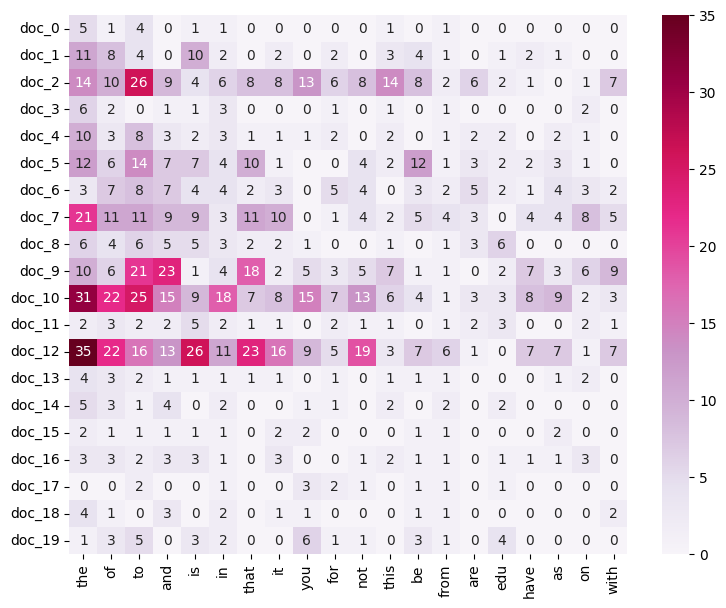

In [14]:
import seaborn as sns

term_frequencies = np.asarray(X_counts.sum(axis=0)).flatten()  # The frequency of each term
reverse_order = np.argsort(term_frequencies)[::-1]  # Sort the term frequencies from largest to smallest
count_vect.get_feature_names_out()[reverse_order][:20]  # Take the top 20 terms with the highest frequencies as an example
plot_x = count_vect.get_feature_names_out()[reverse_order][:20]  # The top 20 most frequent terms

plot_y = ["doc_" + str(i) for i in list(X.index)[0:20]]  # Obtain document index

plot_z = X_counts[0:20, reverse_order[:20]].toarray()  # utilize the top 20 terms for the graph
df_todraw = pd.DataFrame(plot_z, columns=plot_x, index=plot_y)  # Prepare data for plotting
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=X_counts[0:20, reverse_order[:20]].toarray().max(), annot=True)

## So we can see which terms are most commonly used across all documents, sorted by frequency. The matrix is ​​not sparse either.


### >>> **Exercise 12 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [15]:
# Answer here
import plotly.graph_objs as go # the package to create the graph

term_frequencies = np.asarray(X_counts.sum(axis=0))[0] # The frequency of each term
colors = sns.color_palette("Spectral", 300)  # Set the color of the bar chart
hex_colors  = [f'#{int(r * 255):02x}{int(g * 255):02x}{int(b * 255):02x}' for r, g, b in colors] # Convert the color to hexadecimal
#help(plotly.graph_objs) 
x_value = count_vect.get_feature_names_out()[:300]  
y_value = term_frequencies[:300]

# Create a bar chart
fig = go.Figure(data = [
        go.Bar(name='term frequencies', x=x_value, y=y_value, marker=dict(color=hex_colors))
    ])
fig.show()

### >>> **Exercise 13 (take home):** 
The chart above only contains 300 vocabulary in the documents, and it's already computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 


In [16]:
# We create a filter with a threshold of 300 and keep only the term_frequencies greater than 300
filter_index = [i for i, j in enumerate(term_frequencies) if j > 300] # i is the index of term_frequencies greater than 300

filter_terms = count_vect.get_feature_names_out()[filter_index] # terms with term_frequencies greater than 300
filter_y_value = term_frequencies[filter_index] # frequencies of term_frequencies greater than 300
# Create a bar chart
fig = go.Figure(data=[
        go.Bar(name='term frequencies', x=filter_terms, y=filter_y_value)
    ])
fig.show()
print(len(filter_terms)) # The number of single words is less than the number in the picture above.

258


### >>> **Exercise 14 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

In [17]:
# Answer here

reverse_order = np.argsort(term_frequencies)[::-1] ## Sort the term frequencies from largest to smallest

top_terms = count_vect.get_feature_names_out()[reverse_order[:200]] # Take the top 200 terms with the highest frequency as an example

fig = go.Figure(data = [
        go.Bar(name='top term frequencies', x=top_terms, y=term_frequencies[reverse_order[:200]], marker=dict(color=hex_colors))
    ])
fig.show()

### >>> **Exercise 15 (take home):** 
You can copy the code from the previous exercise and change the 'term_frequencies' variable for the 'term_frequencies_log', comment about the differences that you observe and talk about other possible insights that we can get from a log distribution.

In [18]:
# Answer here
import math
term_frequencies_log = [math.log(i) for i in term_frequencies] # Take the natural log of the term frequency

reverse_order = np.argsort(term_frequencies)[::-1] # Sort the term frequencies from largest to smallest
y = [term_frequencies_log[i] for i in reverse_order[:200]] # Take the natural log of the top 200 highest frequencies

top_terms = count_vect.get_feature_names_out()[reverse_order[:200]] # Return the top 200 terms with the highest frequencies

fig = go.Figure(data = [
        go.Bar(name='top term frequencies(log)', x=top_terms, y=y, marker=dict(color=hex_colors))
    ])
fig.show() 

### >>> **Exercise 16 (take home):** 
Review the words that were filtered in each category and comment about the differences and similarities that you can see.

### Answer
**Similarities:**
- In the Top 5.0% words of all categories, there are words like "the," "of," "and," "to," "is," and "that." The reason for this is that these words are used to structure sentences, so they appear regardless of the type of text content.

**Differences:**
- Each category represents a specific topic. In the Top 5.0% words, aside from those functional words, some words are clearly related to the respective topic. For example, the category *soc.religion.christian* is related to religion, so the word "pagan" is highly relevant to the theme.
- The Bottom 1.0% words in each category may be very specialized or detailed terms. For example, *soc.religion.christian* includes words like "feminist" and "remarriage," which seem to refer to aspects of marriage. This suggests they are subtopics within the religious discussion, and they don’t appear as frequently as high-frequency words.

### >>> **Exercise 17 (take home):** 
Implement the FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze the 'comp.graphics' category in our processed database. **Only implement the mining part of the algorithm and display the resulting patterns**, like we did with the FPGrowth algorithm after creating the new databases. For the FAE Top-K, run trials with k values of 500, 1000, and 1500, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these settings as well. Compare the patterns these algorithms extract with those from the previously implemented FPGrowth algorithm. Document your findings, focusing on differences and similarities in the outputs and performance.

In [19]:
# Answer Here
from PAMI.frequentPattern.topk import FAE  as alg # FAE Top-K algorithm


k_values = [500, 1000, 1500] # run trials with k values of 500, 1000, and 1500

# Run the FAE algorithm for each k value
for k in k_values:
    obj = alg.FAE(iFile='td_freq_db_comp_graphics.csv', k=k)  
    obj.mine()  
    frequentPatternsDF_top_k = obj.getPatternsAsDataFrame()  
    print('Total No of patterns: ' + str(len(frequentPatternsDF_top_k))) #print the total number of patterns
    print('Runtime: ' + str(obj.getRuntime())) #measure the runtime

# As the value of k increases, the time required to generate frequent patterns increases accordingly.

 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 500
Runtime: 0.8280196189880371
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 1000
Runtime: 2.5199975967407227
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 1500
Runtime: 5.935070037841797


In [20]:
from PAMI.frequentPattern.maximal import MaxFPGrowth  as alg # Maximal Frequent Pattern algorithm

minSup = [3, 6, 9] # minSup values of 3, 6, and 9

# Run the MaxFPGrowth algorithm for each minSup value
for k in minSup:
    obj = alg.MaxFPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=k)  
    obj.mine()  
    frequentPatternsDF_maxfp = obj.getPatternsAsDataFrame()  
    print('Total No of patterns: ' + str(len(frequentPatternsDF_maxfp))) #print the total number of patterns
    print('Runtime: ' + str(obj.getRuntime())) #measure the runtime
    
# Compared to FAE Top-K, the number of patterns generated by MaxFPGrowth is smaller because it extracts only the maximal sets.
# In terms of runtime, for instance, with a minimum support threshold of 9, MaxFPGrowth takes 0.26 seconds, while FPGrowth takes 0.13 seconds, indicating that MaxFPGrowth has a longer runtime.

Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 6845
Runtime: 21.71204447746277
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 1347
Runtime: 0.29999518394470215
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 660
Runtime: 0.2599813938140869


In [21]:
from PAMI.frequentPattern.basic import FPGrowth as alg # FPGrowth algorithm
minSup=9
obj3 = alg.FPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=minSup)
obj3.mine()
frequentPatternsDF_comp_graphics= obj3.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_comp_graphics))) #print the total number of patterns
print('Runtime: ' + str(obj3.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 33574
Runtime: 0.12799477577209473


### >>> Exercise 18 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

In [22]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['text'])  # X['text'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)


In [23]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
X_pca_tdm_3 = PCA(n_components=3).fit_transform(tdm_df.values) # Perform PCA on the term-document matrix
X_tsne_tdm_3 = TSNE(n_components=3).fit_transform(tdm_df.values) # Perform t-SNE on the term-document matrix
X_umap_tdm_3 = umap.UMAP(n_components=3).fit_transform(tdm_df.values) # Perform UMAP on the term-document matrix

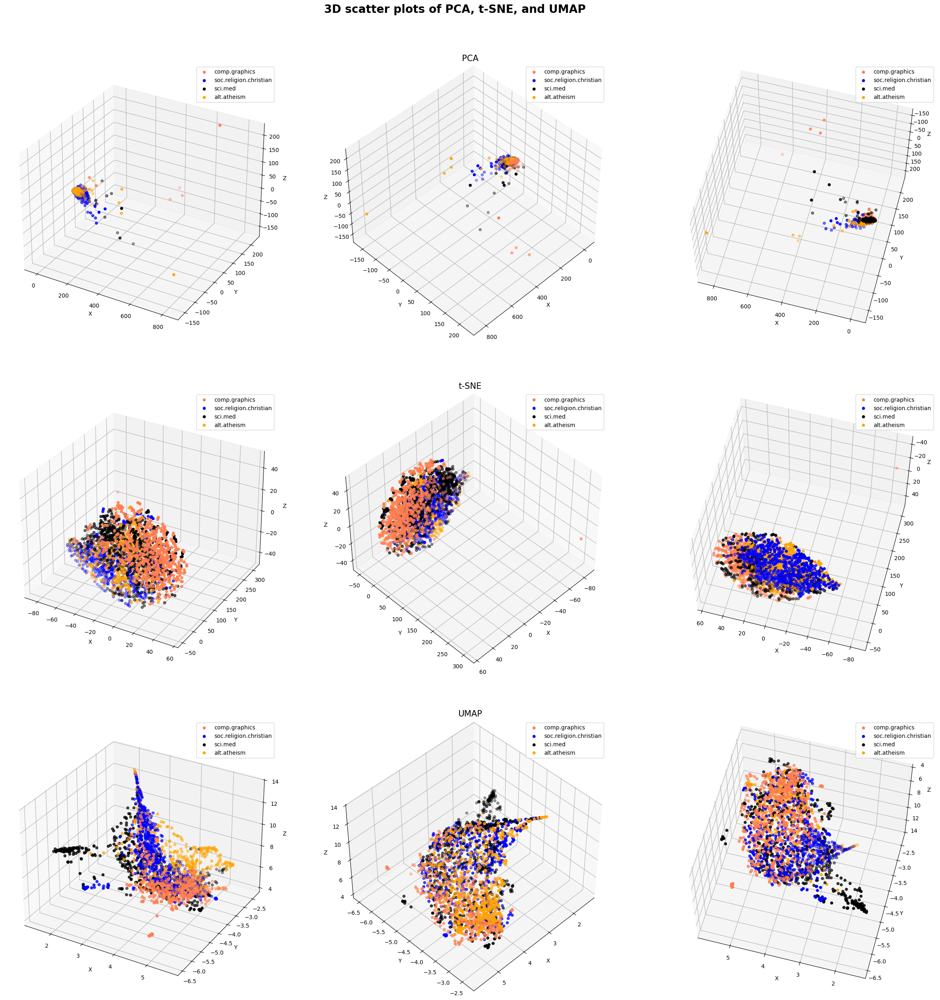

In [24]:
# Answer here

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig = plt.figure(figsize=(30, 30))
axes = [fig.add_subplot(331, projection='3d'), 
        fig.add_subplot(332, projection='3d'), 
        fig.add_subplot(333, projection='3d'),
        fig.add_subplot(334, projection='3d'),
        fig.add_subplot(335, projection='3d'),
        fig.add_subplot(336, projection='3d'),
        fig.add_subplot(337, projection='3d'),
        fig.add_subplot(338, projection='3d'),
        fig.add_subplot(339, projection='3d')]

# Iterate over the axes to set up scatter plots
for ax in axes[:3]:
    for c, category in zip(col, categories):
        xs = X_pca_tdm_3[X['category_name'] == category].T[0]
        ys = X_pca_tdm_3[X['category_name'] == category].T[1]
        zs = X_pca_tdm_3[X['category_name'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

# Set specific view angles for each subplot
axes[1].view_init(elev=45, azim=45)
axes[2].view_init(elev=-120, azim=75)

for ax in axes[3:6]:
    for c, category in zip(col, categories):
        xs = X_tsne_tdm_3[X['category_name'] == category].T[0]
        ys = X_tsne_tdm_3[X['category_name'] == category].T[1]
        zs = X_tsne_tdm_3[X['category_name'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
axes[4].view_init(elev=45, azim=45)
axes[5].view_init(elev=-120, azim=75)
for ax in axes[6:9]:
    for c, category in zip(col, categories):
        xs = X_umap_tdm_3[X['category_name'] == category].T[0]
        ys = X_umap_tdm_3[X['category_name'] == category].T[1]
        zs = X_umap_tdm_3[X['category_name'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
axes[7].view_init(elev=45, azim=45)
axes[8].view_init(elev=-120, azim=75)

plt.suptitle("3D scatter plots of PCA, t-SNE, and UMAP", fontsize=20, fontweight='bold' ,y=0.93)
axes[1].set_title("PCA",fontsize=15)
axes[4].set_title("t-SNE",fontsize=15)
axes[7].set_title("UMAP",fontsize=15)

plt.show()


### >>> **Exercise 19 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [25]:
# Answer here
from sklearn import preprocessing
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.category_name)
X['bin_category_name'] = mlb.transform(X['category_name']).tolist()
X[0:9]
# It is effective to use category_name because it is a categorical variable.

,text,category,category_name,unigrams,bin_category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[From, :, sd345, @, city.ac.uk, (, Michael, Co...","[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[From, :, ani, @, ms.uky.edu, (, Aniruddha, B....","[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[From, :, djohnson, @, cs.ucsd.edu, (, Darin, ...","[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[From, :, s0612596, @, let.rug.nl, (, M.M, ., ...","[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[From, :, stanly, @, grok11.columbiasc.ncr.com...","[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[From, :, vbv, @, lor.eeap.cwru.edu, (, Virgil...","[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[From, :, jodfishe, @, silver.ucs.indiana.edu,...","[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[From, :, aldridge, @, netcom.com, (, Jacqueli...","[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[From, :, geb, @, cs.pitt.edu, (, Gordon, Bank...","[0, 0, 1, 0]"


### Part 2: Analyze the new dataset

In [338]:
import pandas as pd

df = pd.read_csv("Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv")

In [48]:

df.head()

,sentiment,comment,sentiment_numerical
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1


In [49]:
len(df)

1500

In [50]:
# An example of what the subset contains
for comment in df["comment"]:
    print("\n".join(comment.split(".")))
    print("-" * 100)

He was a singer with a golden voice that I love to hear all the time
 I was his great fan at the age of 16years in those days and still now
 Although we have many singers now, but, I can vouch for Jim Reeves all the time
 You feel relaxed, emotional and loving
 Thank you Lord for his life

----------------------------------------------------------------------------------------------------
The mist beautiful voice ever I listened to him when I was a kid and still love his singing Never forgotten The voice of an angel
----------------------------------------------------------------------------------------------------
I have most of Mr
 Reeves songs
  Always love his smooth voice, so comforting and sounds like the people I grew up around
  They were so gentle and sweet, but I had to leave my little town to find a job at age 17
  I graduated early
  I never forgot how great it was to grow up with simple people who had no pretensions -- just loving and gentle, like I think Jesus is

-------

In [51]:
# check missing values
df.isnull().sum()
# There are no missing values in the dataset.

sentiment              0
comment                0
sentiment_numerical    0
dtype: int64

In [52]:
#check duclpicate values
sum(df.duplicated("comment"))


1

In [340]:
#recall duclpicate data 
df[df.duplicated("comment", keep=False)]

#drop duclpicate data
df = df.drop_duplicates("comment")

In [341]:
len(df)

1499

In [55]:
#sampling
df_sample = df.sample(n=1000, random_state=42)

counts_df = df['sentiment'].value_counts()
print("Original data:", counts_df/sum(counts_df))

counts_df_sample = df_sample['sentiment'].value_counts()
print("Sampling data:", counts_df_sample/sum(counts_df_sample))

#we can see that is a balanced dataset

Original data: sentiment
nostalgia        0.500334
not nostalgia    0.499666
Name: count, dtype: float64
Sampling data: sentiment
not nostalgia    0.502
nostalgia        0.498
Name: count, dtype: float64


sentiment
nostalgia        750
not nostalgia    749
Name: count, dtype: int64


<Axes: title={'center': 'Category distribution'}, xlabel='sentiment'>

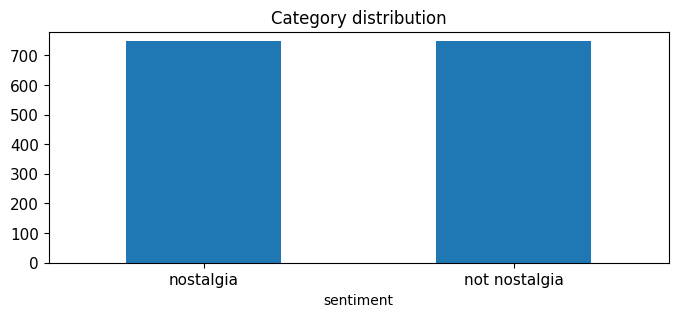

In [56]:
import matplotlib.pyplot as plt
print(df.sentiment.value_counts())
y_max = df.sentiment.value_counts().max()+ 30
# plot barchart for X
df.sentiment.value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    ylim = [0, y_max],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

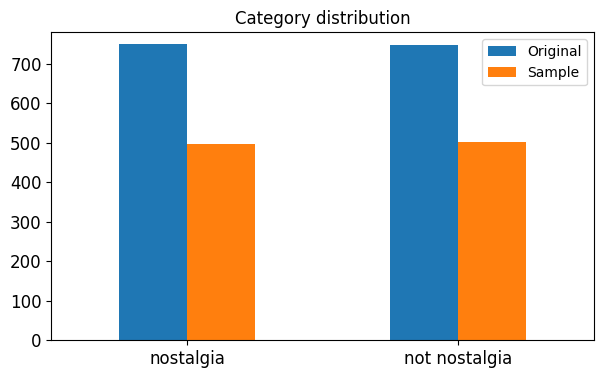

In [57]:
ymax = max(counts_df.max(), counts_df_sample.max()) + 30
pd.concat([counts_df, counts_df_sample], axis = 1).plot(kind = 'bar',
                                           title = 'Category distribution',
                                           ylim = [0, ymax], 
                                           rot = 0, fontsize = 12, figsize = (7,4), xlabel="")
plt.legend(["Original", "Sample"])
plt.show()

In [58]:
import nltk
import helpers.data_mining_helpers as dmh
# takes a like a minute or two to process
# 一元詞組
df['unigrams'] = df['comment'].apply(lambda x: dmh.tokenize_text(x))

In [59]:
df[0:4]["unigrams"]

0    [He, was, a, singer, with, a, golden, voice, t...
1    [The, mist, beautiful, voice, ever, I, listene...
2    [I, have, most, of, Mr., Reeves, songs, ., Alw...
3    [30, day, leave, from, 1st, tour, in, Viet, Na...
Name: unigrams, dtype: object

In [60]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
df_counts = count_vect.fit_transform(df.comment) # learn the vocabulary and return document-term matrix
print(df_counts[0])
print(df_counts.shape) # (1499, 3730) -> 1499 documents and 3730 terms
# (0, 1598)    1 -> 在第0個document中的"1598"詞出現1次


  (np.int32(0), np.int32(1598))	1
  (np.int32(0), np.int32(3570))	2
  (np.int32(0), np.int32(2973))	1
  (np.int32(0), np.int32(3650))	1
  (np.int32(0), np.int32(1470))	1
  (np.int32(0), np.int32(3534))	1
  (np.int32(0), np.int32(3282))	1
  (np.int32(0), np.int32(2028))	1
  (np.int32(0), np.int32(3336))	1
  (np.int32(0), np.int32(1606))	1
  (np.int32(0), np.int32(233))	2
  (np.int32(0), np.int32(3284))	3
  (np.int32(0), np.int32(3328))	2
  (np.int32(0), np.int32(1651))	2
  (np.int32(0), np.int32(1512))	1
  (np.int32(0), np.int32(1249))	1
  (np.int32(0), np.int32(323))	1
  (np.int32(0), np.int32(214))	1
  (np.int32(0), np.int32(2341))	1
  (np.int32(0), np.int32(15))	1
  (np.int32(0), np.int32(1733))	1
  (np.int32(0), np.int32(3304))	1
  (np.int32(0), np.int32(907))	1
  (np.int32(0), np.int32(258))	2
  (np.int32(0), np.int32(3124))	1
  (np.int32(0), np.int32(2328))	2
  (np.int32(0), np.int32(245))	1
  (np.int32(0), np.int32(3581))	1
  (np.int32(0), np.int32(1591))	1
  (np.int32(0), np.int

In [61]:
count_vect.get_feature_names_out()[1598]

'he'

In [62]:
analyze = count_vect.build_analyzer()
analyze(df.comment[0])

['he',
 'was',
 'singer',
 'with',
 'golden',
 'voice',
 'that',
 'love',
 'to',
 'hear',
 'all',
 'the',
 'time',
 'was',
 'his',
 'great',
 'fan',
 'at',
 'the',
 'age',
 'of',
 '16years',
 'in',
 'those',
 'days',
 'and',
 'still',
 'now',
 'although',
 'we',
 'have',
 'many',
 'singers',
 'now',
 'but',
 'can',
 'vouch',
 'for',
 'jim',
 'reeves',
 'all',
 'the',
 'time',
 'you',
 'feel',
 'relaxed',
 'emotional',
 'and',
 'loving',
 'thank',
 'you',
 'lord',
 'for',
 'his',
 'life']

In [63]:
print(df_counts[0:5,0:100])
print(df_counts[0:5, 0:100].toarray())
# Found to be a sparse matrix

  (np.int32(0), np.int32(15))	1
  (np.int32(2), np.int32(16))	1
  (np.int32(3), np.int32(91))	1
  (np.int32(3), np.int32(62))	1
  (np.int32(3), np.int32(90))	1
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 

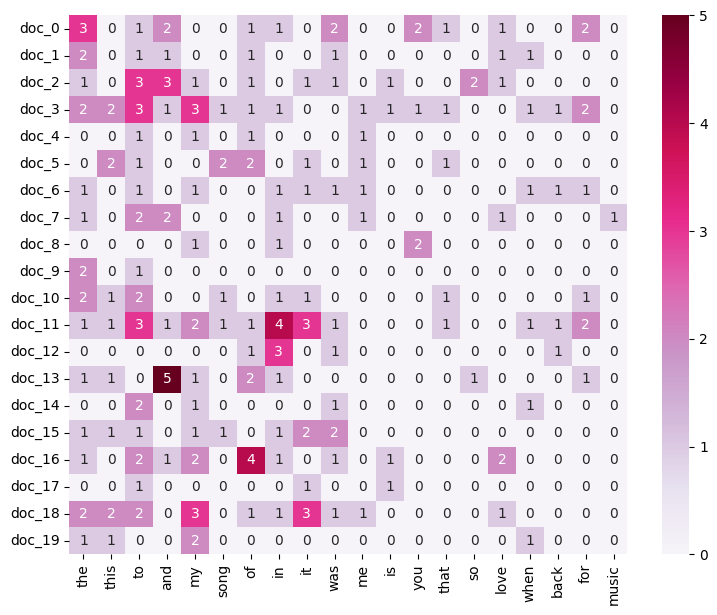

In [64]:
# What I want to show is to see the relationship between the 20 most frequent words and the first 20 files
term_frequencies = np.asarray(df_counts.sum(axis=0)).flatten() # The frequency of each terms
reverse_order = np.argsort(term_frequencies)[::-1] # Sort the term frequencies from largest to smallest
count_vect.get_feature_names_out()[reverse_order][:20]# The top 20 most frequent terms
plot_x = count_vect.get_feature_names_out()[reverse_order][:20] 

plot_y = ["doc_"+ str(i) for i in list(df.index)[0:20]]# obtain document index

plot_z = df_counts[0:20, reverse_order[:20]].toarray() # only utilize the first 20 terms for the graph
df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)#plot the graph 
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=df_counts[0:20, reverse_order[:20]].toarray().max(), annot=True)

In [65]:
import seaborn as sns
import plotly.graph_objs as go


colors = sns.color_palette("Spectral", 300)  
hex_colors  = [f'#{int(r * 255):02x}{int(g * 255):02x}{int(b * 255):02x}' for r, g, b in colors]
#help(plotly.graph_objs) 
x_value = count_vect.get_feature_names_out()[:300]  
y_value = term_frequencies[:300]

fig = go.Figure(data = [
        go.Bar(name='term frequencies', x=x_value, y=y_value, marker=dict(color=hex_colors))
    ])
fig.show()


In [66]:
# We create a filter with a threshold of 50 and keep only the term_frequencies greater than 50
filter_index = [i for i, j in enumerate(term_frequencies) if j > 50] # i is the index of term_frequencies greater than 50

filter_terms = count_vect.get_feature_names_out()[filter_index] # terms with term_frequencies greater than 50
filter_y_value = term_frequencies[filter_index] # frequencies of term_frequencies greater than 50
# Create a bar chart
fig = go.Figure(data=[
        go.Bar(name='term frequencies', x=filter_terms, y=filter_y_value)
    ])
fig.show()
print(len(filter_terms)) # The number of single words is less than the number in the picture above.

124


In [67]:
# Answer here

reverse_order = np.argsort(term_frequencies)[::-1] # Sort the term frequencies from largest to smallest

top_terms = count_vect.get_feature_names_out()[reverse_order[:200]]

fig = go.Figure(data = [
        go.Bar(name='top term frequencies', x=top_terms, y=term_frequencies[reverse_order[:200]], marker=dict(color=hex_colors))
    ])
fig.show()
# we can see some patterns in the data, the frequency of words before "was" decreased very quickly, and then it slowed down.

In [68]:

import math
term_frequencies_log = [math.log(i) for i in term_frequencies] # Take the natural log of the term frequency

reverse_order = np.argsort(term_frequencies)[::-1] # Sort the term frequencies from largest to smallest
y = [term_frequencies_log[i] for i in reverse_order[:200]] # Take the natural log of the top 200 highest frequencies

top_terms = count_vect.get_feature_names_out()[reverse_order[:200]] # Return the top 200 terms with the highest frequencies

fig = go.Figure(data = [
        go.Bar(name='top term frequencies(log)', x=top_terms, y=y, marker=dict(color=hex_colors))
    ])
fig.show() 

In [69]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = df['sentiment'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = df[df['sentiment'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    df_counts = count_vect.fit_transform(df['comment'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(df_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs  = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
   filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [70]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector
category_number=1
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
filt_term_document_dfs [categories[category_number]]

Filtered Term-Document Frequency DataFrame for Category nostalgia:


,07,10,11,11th,12,13,14,15,16,17,...,young,younger,youngster,your,yours,youth,youthful,youtube,yrs,yup
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
748,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


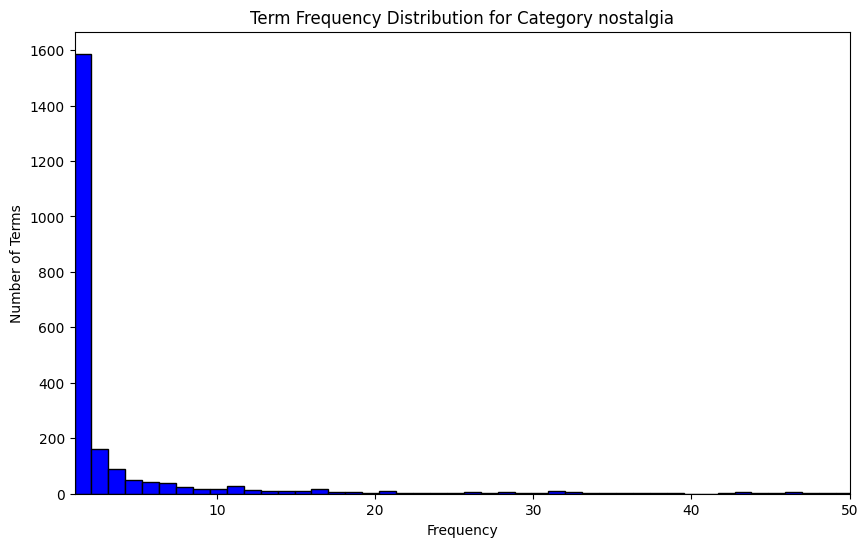

In [71]:
 # Sum over all documents to get total frequency for each word
category_number=1 
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=600, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 50)
plt.show()
# 頻率0~1次的超多

In [72]:
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: not nostalgia
Number of terms in top 5%: 130
Filtered terms: ['the', 'this', 'and', 'to', 'of', 'song', 'it', 'is', 'in', 'you', 'that', 'my', 'love', 'music', 'was', 'for', 'so', 'have', 'one', 'like', 'but', 'he', 'with', 'great', 'all', 'what', 'on', 'not', 'be', 'can', 'me', 'voice', 'just', 'songs', 'beautiful', 'as', 'time', 'her', 'she', 'will', 'they', 'when', 'from', 'his', 'at', 'are', 'always', 'good', 'no', 'know', 'never', 'now', 'about', 'much', 'who', 'really', 'more', 'if', 'we', 'best', 'by', 'ever', 'think', 'would', 'thank', 'only', 'still', 'how', 'don', 'has', 'very', 'am', 'there', 'out', 'him', 'could', 'these', 'up', 'old', 'listen', 'hear', 'do', 'an', 'singer', 'many', 'had', 'here', 'version', 'too', 'such', 'today', 'been', 'world', 'your', 'people', 'most', 'get', 'video', 'heard', 'man', 'some', 'listening', 'sing', 'than', 'were', 'years', 'real', 'heart', 'nice', 'singing', 'their', 'better', 'life', 'its', 'day', 'sad', 'god', 'then', 'way', '

In [73]:
category_number=1 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: nostalgia
Number of terms in top 5%: 114
Filtered terms: ['the', 'my', 'this', 'to', 'and', 'song', 'was', 'of', 'in', 'it', 'me', 'back', 'memories', 'when', 'so', 'years', 'that', 'on', 'love', 'for', 'time', 'you', 'remember', 'old', 'with', 'is', 'music', 'great', 'brings', 'we', 'beautiful', 'as', 'all', 'now', 'but', 'days', 'at', 'good', 'miss', 'songs', 'childhood', 'reminds', 'her', 'from', 'still', 'just', 'he', 'always', 'have', 'she', 'first', 'dad', 'had', 'many', 'much', 'listening', 'his', 'up', 'like', 'loved', 'used', 'school', 'were', 'am', 'those', 'one', 'very', 'voice', 'be', 'him', 'every', 'times', 'never', 'these', 'heard', 'can', 'listen', 'not', 'young', 'what', 'played', 'best', 'they', 'are', 'hear', 'out', 'sing', 'thank', 'life', 'how', 'happy', 'then', 'thanks', 'radio', 'again', 'ago', 'really', 'mum', 'play', 'day', 'an', 'who', 'mom', 'some', 'our', 'there', 'singing', 'wonderful', 'after', 'makes', 'came', 'passed', 'will', 'little']


In [74]:
category_number=0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: not nostalgia
Number of terms in bottom 1%: 26
Filtered terms: ['12', '16years', 'zealand', 'sensitive', 'sense', 'xd', 'wwii', 'wuv', 'writers', 'writer', 'wrenching', 'wouldn', '1998', 'measure', 'spine', 'spewing', '2040', '2018', '2017', '2010', '1957', '1955', '1952', '1930s', '1930', '17th']


In [75]:
category_number=1 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: nostalgia
Number of terms in bottom 1%: 22
Filtered terms: ['yo', 'yet', 'yester', 'yeas', 'yearn', 'yeah', '1952', '1950', '1969', '1964', 'lp', 'safety', 'safer', 'saddest', 'seeing', 'lou', 'proud', 'protest', '2002', 'yup', '1927', '11th']


In [76]:
# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])


For category not nostalgia we filter the following words:
Bottom 1.0% words: 
12           1
16years      1
zealand      1
sensitive    1
sense        1
xd           1
wwii         1
wuv          1
writers      1
writer       1
wrenching    1
wouldn       1
1998         1
measure      1
spine        1
spewing      1
2040         1
2018         1
2017         1
2010         1
1957         1
1955         1
1952         1
1930s        1
1930         1
17th         1
dtype: int64
Top 5.0% words: 
first       23
got         23
amazing     23
wish        24
any         25
          ... 
of         361
to         394
and        451
this       452
the        708
Length: 130, dtype: int64

For category nostalgia we filter the following words:
Bottom 1.0% words: 
yo         1
yet        1
yester     1
yeas       1
yearn      1
yeah       1
1952       1
1950       1
1969       1
1964       1
lp         1
safety     1
safer      1
saddest    1
seeing     1
lou        1
proud      1
protest    1
2

In [35]:
from PAMI.extras.DF2DB import DenseFormatDF as db

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    obj = db.DenseFormatDF(term_document_dfs[category])
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)

Database size (total no of transactions) : 746
Number of items : 2446
Minimum Transaction Size : 1
Average Transaction Size : 8.399463806970509
Maximum Transaction Size : 47
Standard Deviation Transaction Size : 5.940834266064001
Variance in Transaction Sizes : 35.3408856181514
Sparsity : 0.9965660409619908


Database size (total no of transactions) : 734
Number of items : 2159
Minimum Transaction Size : 1
Average Transaction Size : 8.696185286103542
Maximum Transaction Size : 39
Standard Deviation Transaction Size : 7.20498326251217
Variance in Transaction Sizes : 51.982604800547186
Sparsity : 0.9959721235358483




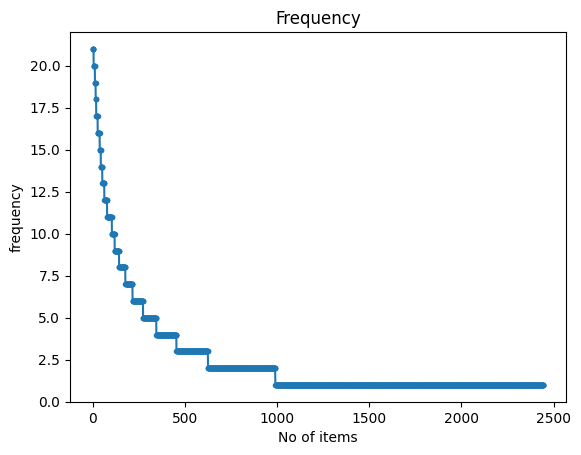

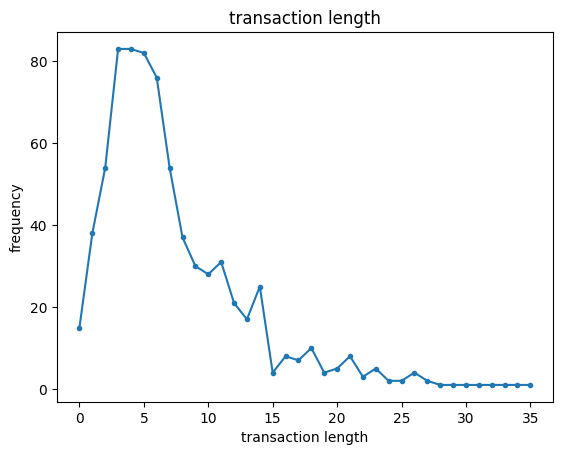

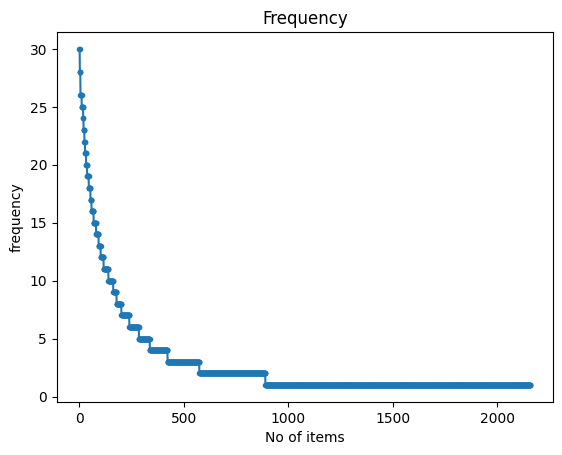

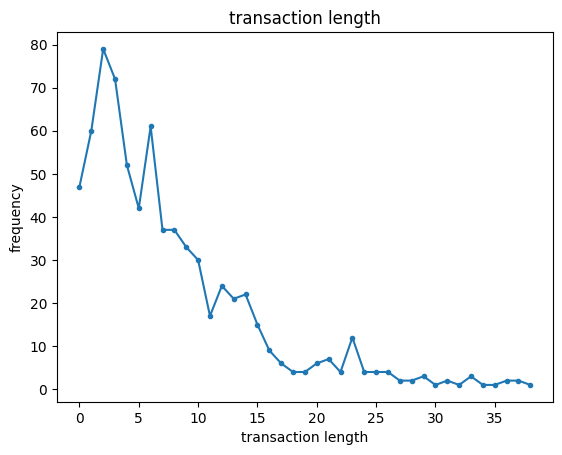

In [77]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
for category in categories:
    category_safe = category.replace('.', '_')
    obj = tds.TransactionalDatabase(f'td_freq_db_{category_safe}.csv')
    obj.run()
    obj.printStats()
    obj.plotGraphs()
    print('\n')

In [78]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=3
obj1 = alg.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_nostalgia= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 938
Runtime: 0.025998592376708984


In [39]:
obj1.save('freq_patterns_nostalgia_minSup3.txt') #save the patterns
frequentPatternsDF_nostalgia

,Patterns,Support
0,forgot,3
1,mr,3
2,appreciate,3
3,death,3
4,death jim,3
...,...,...
933,ever,28
934,would,28
935,go,28
936,takes,30


In [80]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=3
obj2 = alg.FPGrowth(iFile='td_freq_db_not nostalgia.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_not_nostalgia= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_not_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 730
Runtime: 0.26798415184020996


In [81]:
obj2.save('freq_patterns_not_nostalgia_minSup3.txt') #save the patterns
frequentPatternsDF_nostalgia

,Patterns,Support
0,forgot,3
1,mr,3
2,appreciate,3
3,death,3
4,death jim,3
...,...,...
933,ever,28
934,would,28
935,go,28
936,takes,30


In [82]:
import pandas as pd

#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_not_nostalgia, frequentPatternsDF_nostalgia]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for i in dfs:
    for pattern in i['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(i) for i in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for i in dfs:
    filtered_df = i[i['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

       Patterns  Support
1041      would       28
1040       ever       28
1030       only       26
1037       wish       26
1028        kid       26
...         ...      ...
994   long ever        3
993    long has        3
32        touch        3
31      soulful        3
1009  has would        3

[1042 rows x 2 columns]
Number of patterns discarded: 626


In [87]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(df['comment'])  # df['comment'] contains your text data (Term-Document Matrix)
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words ex: doc1 = {"a","b","c"}
df['tokenized_text'] = df['comment'].str.split().apply(set)

# Initialize the pattern matrix (1499, 1042)
pattern_matrix = pd.DataFrame(0, index=df.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words ex:{"word"}
    pattern_matrix[pattern] = df['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=df.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,year by,child such,anymore gonna sun ain shine,sad by,gonna sun ain shine,long ever,long has,touch,soulful,has would
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [111]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
df_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
df_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
df_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

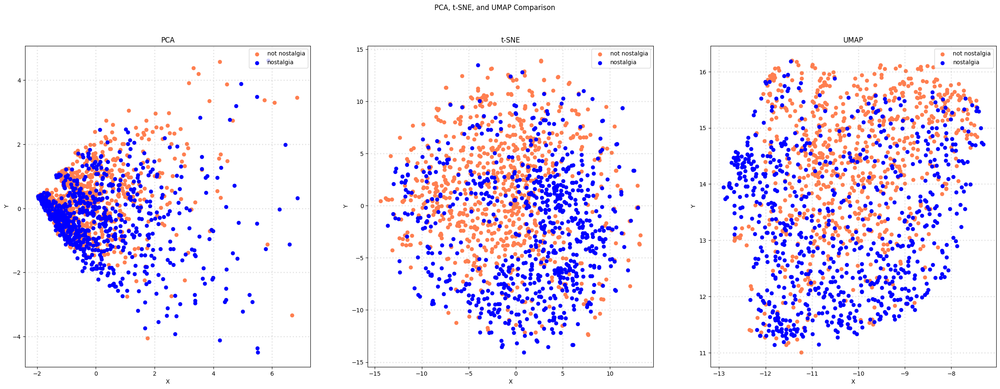

In [116]:
# Plot the results in subplots
col = ['coral', 'blue']
categories = df['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[df['sentiment'] == category].T[0]
        ys = X_reduced[df['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], df_pca_tdm, 'PCA')
plot_scatter(axes[1], df_tsne_tdm, 't-SNE')
plot_scatter(axes[2], df_umap_tdm, 'UMAP')


In [117]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
df_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
df_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
df_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

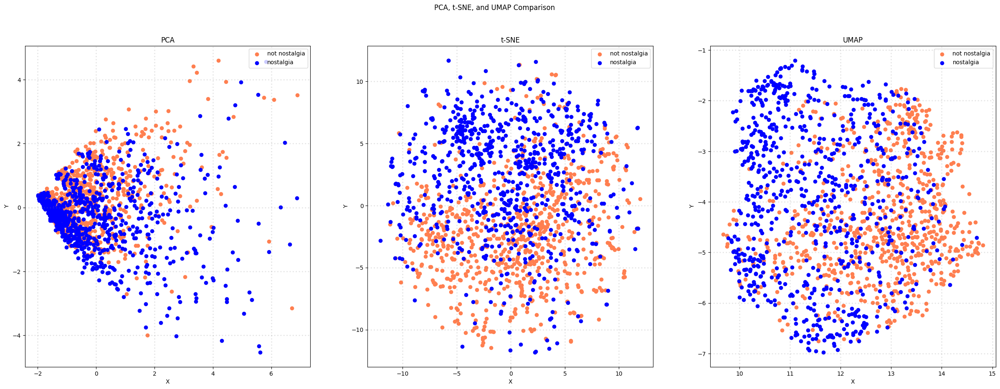

In [118]:
# Plot the results in subplots
col = ['coral', 'blue']
categories = df['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[df['sentiment'] == category].T[0]
        ys = X_reduced[df['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], df_pca_aug, 'PCA')
plot_scatter(axes[1], df_tsne_aug, 't-SNE')
plot_scatter(axes[2], df_umap_aug, 'UMAP')

In [119]:
df_pca_tdm = PCA(n_components=3).fit_transform(tdm_df.values)
df_tsne_tdm = TSNE(n_components=3).fit_transform(tdm_df.values)
df_umap_tdm = umap.UMAP(n_components=3).fit_transform(tdm_df.values)

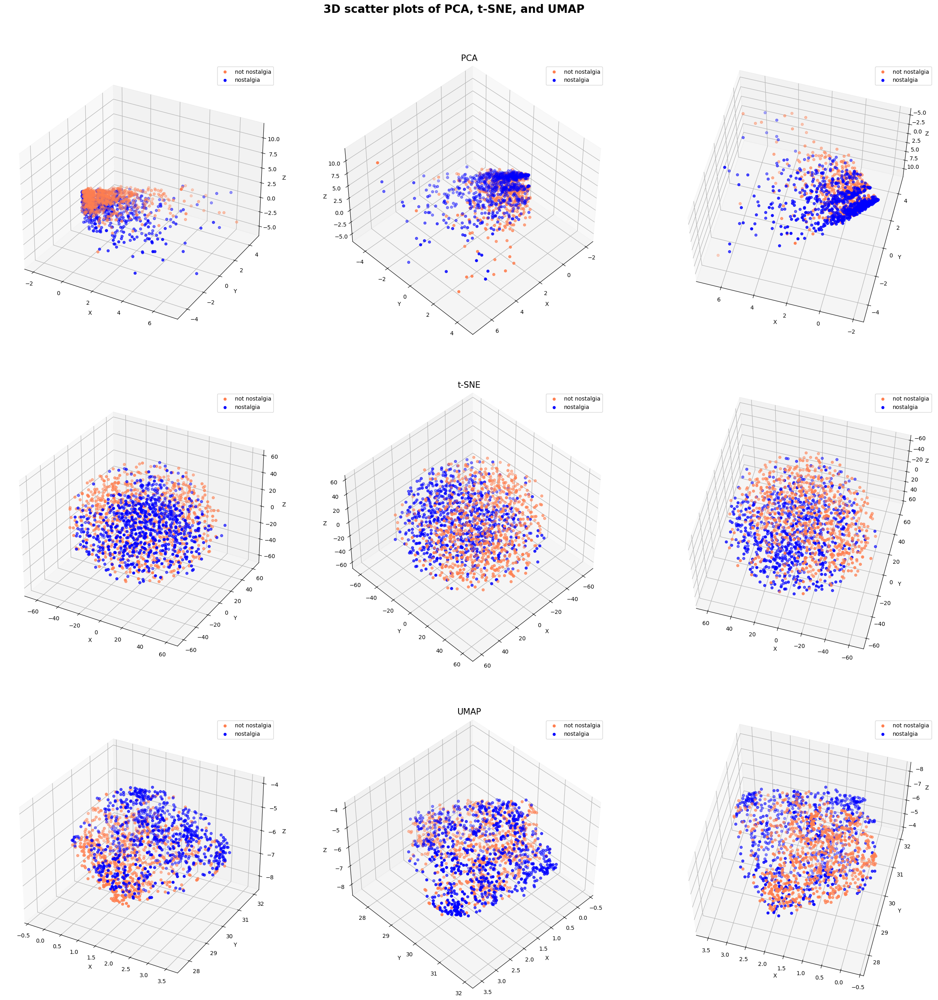

In [121]:
# Answer here

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

col = ['coral', 'blue']
categories = df['sentiment'].unique() 

fig = plt.figure(figsize=(30, 30))
axes = [fig.add_subplot(331, projection='3d'), 
        fig.add_subplot(332, projection='3d'), 
        fig.add_subplot(333, projection='3d'),
        fig.add_subplot(334, projection='3d'),
        fig.add_subplot(335, projection='3d'),
        fig.add_subplot(336, projection='3d'),
        fig.add_subplot(337, projection='3d'),
        fig.add_subplot(338, projection='3d'),
        fig.add_subplot(339, projection='3d')]

# Iterate over the axes to set up scatter plots
for ax in axes[:3]:
    for c, category in zip(col, categories):
        xs = df_pca_tdm[df['sentiment'] == category].T[0]
        ys = df_pca_tdm[df['sentiment'] == category].T[1]
        zs = df_pca_tdm[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

# Set specific view angles for each subplot
axes[1].view_init(elev=45, azim=45)
axes[2].view_init(elev=-120, azim=75)

for ax in axes[3:6]:
    for c, category in zip(col, categories):
        xs = df_tsne_tdm[df['sentiment'] == category].T[0]
        ys = df_tsne_tdm[df['sentiment'] == category].T[1]
        zs = df_tsne_tdm[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
axes[4].view_init(elev=45, azim=45)
axes[5].view_init(elev=-120, azim=75)
for ax in axes[6:9]:
    for c, category in zip(col, categories):
        xs = df_umap_tdm[df['sentiment'] == category].T[0]
        ys = df_umap_tdm[df['sentiment'] == category].T[1]
        zs = df_umap_tdm[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
axes[7].view_init(elev=45, azim=45)
axes[8].view_init(elev=-120, azim=75)

plt.suptitle("3D scatter plots of PCA, t-SNE, and UMAP", fontsize=20, fontweight='bold' ,y=0.93)
axes[1].set_title("PCA",fontsize=15)
axes[4].set_title("t-SNE",fontsize=15)
axes[7].set_title("UMAP",fontsize=15)

plt.show()

In [122]:
df_pca_aug = PCA(n_components=3).fit_transform(augmented_df.values)
df_tsne_aug = TSNE(n_components=3).fit_transform(augmented_df.values)
df_umap_aug = umap.UMAP(n_components=3).fit_transform(augmented_df.values)

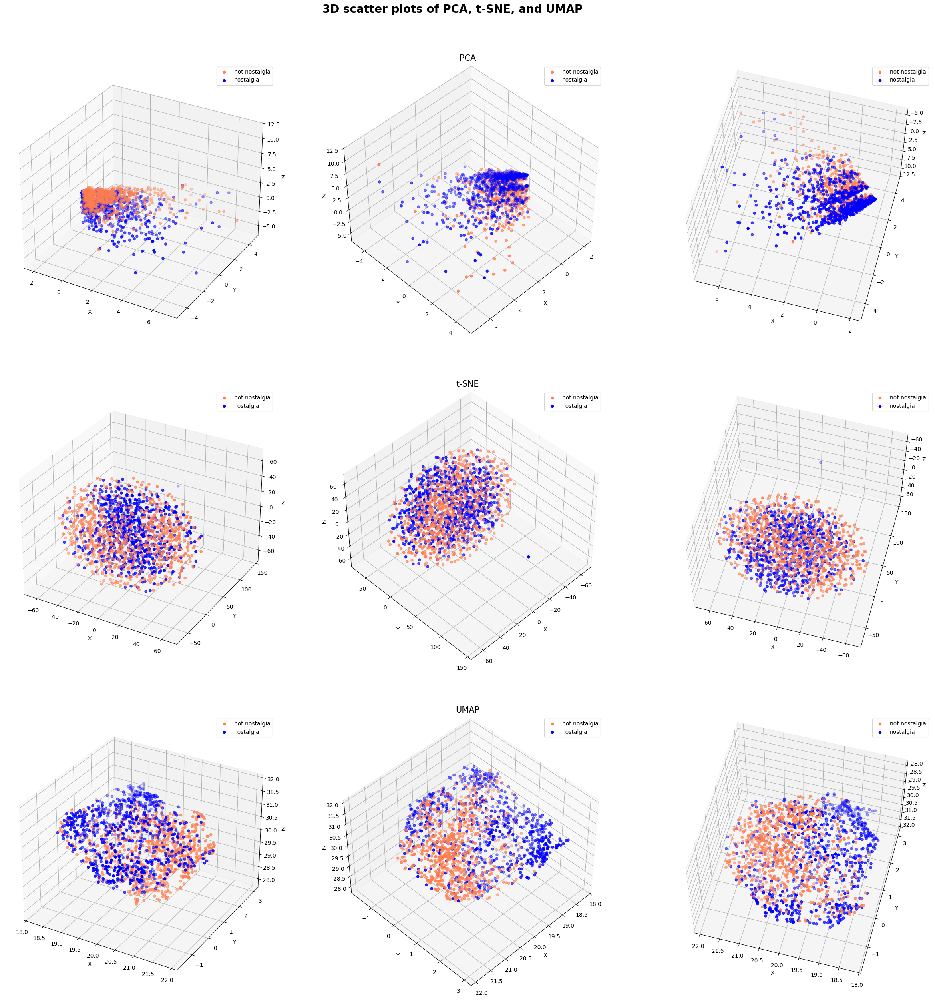

In [123]:
# Answer here

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

col = ['coral', 'blue']
categories = df['sentiment'].unique() 

fig = plt.figure(figsize=(30, 30))
axes = [fig.add_subplot(331, projection='3d'), 
        fig.add_subplot(332, projection='3d'), 
        fig.add_subplot(333, projection='3d'),
        fig.add_subplot(334, projection='3d'),
        fig.add_subplot(335, projection='3d'),
        fig.add_subplot(336, projection='3d'),
        fig.add_subplot(337, projection='3d'),
        fig.add_subplot(338, projection='3d'),
        fig.add_subplot(339, projection='3d')]

# Iterate over the axes to set up scatter plots
for ax in axes[:3]:
    for c, category in zip(col, categories):
        xs = df_pca_aug[df['sentiment'] == category].T[0]
        ys = df_pca_aug[df['sentiment'] == category].T[1]
        zs = df_pca_aug[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')

# Set specific view angles for each subplot
axes[1].view_init(elev=45, azim=45)
axes[2].view_init(elev=-120, azim=75)

for ax in axes[3:6]:
    for c, category in zip(col, categories):
        xs = df_tsne_aug[df['sentiment'] == category].T[0]
        ys = df_tsne_aug[df['sentiment'] == category].T[1]
        zs = df_tsne_aug[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
axes[4].view_init(elev=45, azim=45)
axes[5].view_init(elev=-120, azim=75)
for ax in axes[6:9]:
    for c, category in zip(col, categories):
        xs = df_umap_aug[df['sentiment'] == category].T[0]
        ys = df_umap_aug[df['sentiment'] == category].T[1]
        zs = df_umap_aug[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend(loc='upper right')
axes[7].view_init(elev=45, azim=45)
axes[8].view_init(elev=-120, azim=75)

plt.suptitle("3D scatter plots of PCA, t-SNE, and UMAP", fontsize=20, fontweight='bold' ,y=0.93)
axes[1].set_title("PCA",fontsize=15)
axes[4].set_title("t-SNE",fontsize=15)
axes[7].set_title("UMAP",fontsize=15)

plt.show()

In [124]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

mlb = preprocessing.LabelBinarizer()
mlb.fit(df.sentiment)

LabelBinarizer()

In [132]:
df['bin_category'] = mlb.transform(df['sentiment']).tolist()

In [135]:
df.head()

,sentiment,comment,unigrams,tokenized_text,bin_category
0,not nostalgia,He was a singer with a golden voice that I lov...,"[He, was, a, singer, with, a, golden, voice, t...","{love, with, many, age, was, You, life., all, ...",[1]
1,nostalgia,The mist beautiful voice ever I listened to hi...,"[The, mist, beautiful, voice, ever, I, listene...","{love, Never, was, The, beautiful, angel, when...",[0]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{love, Mr., with, town, Jesus, find, had, age,...",[0]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{This, Lou, pray, leave, day, this, man, tour,...",[1]
4,nostalgia,listening to his songs reminds me of my mum wh...,"[listening, to, his, songs, reminds, me, of, m...","{songs, played, to, listening, everyday, mum, ...",[0]


In [288]:
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = df.iloc[50]
random_record_1 = random_record_1['comment']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = df.iloc[100]
random_record_2 = random_record_2['comment']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = df.iloc[150]
random_record_3 = random_record_3['comment']
document_to_transform_3.append(random_record_3)

In [289]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['If I remember correctly, this song came out after Mr. Reeves passed away. I was about 10 years old when the disc jockey said that the news just came over the wire that he died in a plane crash.']
['i guess most of us leave it too late before we tell someone just how much we really love them']
['my name is thomas but know by tommy and my wifes name is laura and i always sing this to her']


In [290]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [291]:
x,y = document_vector_count_1.toarray().nonzero()
print(y)
document_vector_count_1.toarray()[x,y]

[   4  167  208  350  589  820  841  970  979 1598 1713 1733 1839 1858
 2234 2290 2351 2382 2387 2427 2494 2671 2699 2815 3044 3282 3284 3300
 3570 3610 3643 3704]


array([1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 2, 3, 1, 1, 1, 1, 1])

In [292]:
document_vector_count_1_bin.toarray()[x,y]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [293]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.032174
Cosine Similarity using count bw 1 and 3: 0.027864
Cosine Similarity using count bw 2 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


C:\Users\f9006\AppData\Local\Temp\ipykernel_13364\452772485.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\f9006\AppData\Local\Temp\ipykernel_13364\452772485.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\f9006\AppData\Local\Temp\ipykernel_13364\452772485.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\f9006\AppData\Local\Temp\ipykernel_13364\452772485.py:17: DeprecationWarning:

Conversion of an array with ndim > 0 to a 

In [298]:
df["sentiment_num"] = df.sentiment.map({'nostalgia': 0, 'not nostalgia': 1})

In [312]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(df[['sentiment', 'sentiment_num']].drop_duplicates().values)
print(category_mapping)
# Convert the numerical category labels to text labels
target_names = [str(category_mapping[label]) for label in sorted(category_mapping.keys())]
print(target_names)
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, df['sentiment'], test_size=0.3, random_state=42)

{'not nostalgia': 1, 'nostalgia': 0}
['0', '1']


In [313]:
X_train


,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
528,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
845,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
861,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [314]:
X_test


,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
1117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1396,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
414,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
452,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [315]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
               precision    recall  f1-score   support

           0     0.8222    0.9528    0.8827       233
           1     0.9389    0.7788    0.8514       217

    accuracy                         0.8689       450
   macro avg     0.8806    0.8658    0.8670       450
weighted avg     0.8785    0.8689    0.8676       450



### Part 3: 

In [342]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
df_counts = vectorizer.fit_transform(df.comment) # learn the vocabulary and return document-term matrix
print(df_counts[0])
print(df_counts.shape) # (1499, 3730) -> 1499 documents and 3730 terms
# (0, 1598)  	0.1051 -> 在第0個document中的1598詞的tf-idf值 為0.1051


  (np.int32(0), np.int32(1598))	0.10512815802912398
  (np.int32(0), np.int32(3570))	0.1395574769171071
  (np.int32(0), np.int32(2973))	0.13337780025660986
  (np.int32(0), np.int32(3650))	0.09117642312434776
  (np.int32(0), np.int32(1470))	0.17742470356320433
  (np.int32(0), np.int32(3534))	0.10560382174971122
  (np.int32(0), np.int32(3282))	0.08099760357962565
  (np.int32(0), np.int32(2028))	0.08426437228313143
  (np.int32(0), np.int32(3336))	0.05656163791989449
  (np.int32(0), np.int32(1606))	0.11892115591975148
  (np.int32(0), np.int32(233))	0.19791015577918225
  (np.int32(0), np.int32(3284))	0.1516330924946833
  (np.int32(0), np.int32(3328))	0.18797687737677285
  (np.int32(0), np.int32(1651))	0.22761435073116082
  (np.int32(0), np.int32(1512))	0.09515621480982876
  (np.int32(0), np.int32(1249))	0.19852539212933534
  (np.int32(0), np.int32(323))	0.10633155023896874
  (np.int32(0), np.int32(214))	0.14662969149477417
  (np.int32(0), np.int32(2341))	0.061599247801622355
  (np.int32(0), 